In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
%matplotlib inline

In [3]:
import sys
sys.path.insert(0,"../python")

In [4]:
# set directories
outdir = "./fcr_figures"
basedir = "/scratch/gpfs/EOST/changgoo/tigress_classic/"

In [5]:
# model initialization
model_name = {
    "crmhd_v2-8pc-b1-diode-lngrad_out": "crmhd",
    "physics_crmhd-int_rk2-xo_2-ia_false-fbin_0.0-fgas_0.7-beta_1-MHDBC_diode-CRBC_lngrad_out-shear_false-8pc-fe05": "crmhd-fcr0.05",
}

model_color = {
    "crmhd_v2-8pc-b1-diode-lngrad_out": "#E77500",
    "physics_crmhd-int_rk2-xo_2-ia_false-fbin_0.0-fgas_0.7-beta_1-MHDBC_diode-CRBC_lngrad_out-shear_false-8pc-fe05": "#0F4D92",
}

In [140]:
from cr_zprof import cr_data_load, load_group, load_windpdf, load_velocity_pdfs

In [7]:
model_dict = cr_data_load(basedir)

Available models in /scratch/gpfs/EOST/changgoo/tigress_classic/:
  - crmhd-16pc-b0.1-diode-lngrad_out
  - crmhd-16pc-b0.1-lngrad_out-diode
  - crmhd-16pc-b0.1-lngrad_out-lngrad_out
  - crmhd-16pc-b1-diode-diode
  - crmhd-16pc-b1-diode-lngrad
  - crmhd-16pc-b1-diode-lngrad_out
  - crmhd-16pc-b1-diode-lngrad_out-Vmax10
  - crmhd-16pc-b1-diode-lngrad_out
  - crmhd-16pc-b1-diode-lngrad_out-sigma27_va0
  - crmhd-16pc-b1-diode-lngrad_out-sigma27_va1
  - crmhd-16pc-b1-diode-lngrad_out-sigma27_va1_1
  - crmhd-16pc-b1-diode-lngrad_out-sigma28
  - crmhd-16pc-b1-diode-lngrad_out-sigma28_va0
  - crmhd-16pc-b1-diode-lngrad_out-sigma28_va1
  - crmhd-16pc-b1-diode-lngrad_out-sigma28_va1_1
  - crmhd-16pc-b1-diode-lngrad_out-sigma28_va1_2
  - crmhd-16pc-b1-diode-lngrad_out-sigma29_va0
  - crmhd-16pc-b1-diode-lngrad_out-sigma29_va1
  - crmhd-16pc-b1-diode-lngrad_out-sigma29_va1_1
  - crmhd-16pc-b1-diode-lngrad_out-sigma29_va1_2
  - crmhd-16pc-b1-lngrad_out-diode-sigma28
  - crmhd-16pc-b1-lngrad_out-lng

In [141]:
from load_sim_tigresspp import LoadSimTIGRESSPPAll

In [9]:
# load simulations
sa = LoadSimTIGRESSPPAll(model_dict)
simgroup = dict()
group = "fcr"
simgroup[group] = {m: sa.set_model(m, verbose=True) for m in model_name}
sims = simgroup[group]

[LoadSimTIGRESSPP-INFO] basedir: /scratch/gpfs/EOST/changgoo/tigress_classic/crmhd_v2-8pc-b1-mhdbc_diode-crbc_lngrad_out-icpx
[LoadSimTIGRESSPP-INFO] savdir: /scratch/gpfs/EOST/changgoo/tigress_classic/crmhd_v2-8pc-b1-mhdbc_diode-crbc_lngrad_out-icpx
[LoadSimTIGRESSPP-INFO] load_method: xarray
[FindFiles-INFO] athinput: /scratch/gpfs/EOST/changgoo/tigress_classic/crmhd_v2-8pc-b1-mhdbc_diode-crbc_lngrad_out-icpx/athinput.runtime
[FindFiles-INFO] athena_variant: Athena++
[FindFiles-INFO] problem_id: TIGRESS
[FindFiles-INFO] hdf5 (prim,uov): /scratch/gpfs/EOST/changgoo/tigress_classic/crmhd_v2-8pc-b1-mhdbc_diode-crbc_lngrad_out-icpx nums: 0-100
[FindFiles-INFO] parbin (par0): /scratch/gpfs/EOST/changgoo/tigress_classic/crmhd_v2-8pc-b1-mhdbc_diode-crbc_lngrad_out-icpx nums: 0-100
[FindFiles-INFO] parhst: /scratch/gpfs/EOST/changgoo/tigress_classic/crmhd_v2-8pc-b1-mhdbc_diode-crbc_lngrad_out-icpx pids: 1-407
[FindFiles-INFO] loop_time: /scratch/gpfs/EOST/changgoo/tigress_classic/crmhd_v2-8p

In [10]:
# load data
load_group(simgroup, group)

loading crmhd_v2-8pc-b1-diode-lngrad_out...


[LoadSimTIGRESSPP-INFO] Read from existing netcdf: /scratch/gpfs/EOST/changgoo/tigress_classic/crmhd_v2-8pc-b1-mhdbc_diode-crbc_lngrad_out-icpx/merged_zprof/merged_zprof.nc
[LoadSimTIGRESSPP-INFO] [read_hst]: Reading pickle.


loading physics_crmhd-int_rk2-xo_2-ia_false-fbin_0.0-fgas_0.7-beta_1-MHDBC_diode-CRBC_lngrad_out-shear_false-8pc-fe05...


[LoadSimTIGRESSPP-INFO] Read from existing netcdf: /scratch/gpfs/EOST/changgoo/tigress_classic/physics_crmhd-int_rk2-xo_2-ia_false-fbin_0.0-fgas_0.7-beta_1-MHDBC_diode-CRBC_lngrad_out-shear_false-8pc-fe05/merged_zprof/merged_zprof.nc
[LoadSimTIGRESSPP-INFO] [read_hst]: Reading pickle.


In [12]:
tslice = slice(150,500)
s = sims["crmhd_v2-8pc-b1-diode-lngrad_out"]
zp = s.load_zprof_postproc()
load_windpdf(s, tslice=tslice, both=True)

[LoadSimTIGRESSPP-INFO] save folder is set to /scratch/gpfs/EOST/changgoo/tigress_classic/crmhd_v2-8pc-b1-mhdbc_diode-crbc_lngrad_out-icpx/zprof_postproc
[LoadSimTIGRESSPP-INFO] reading: /scratch/gpfs/EOST/changgoo/tigress_classic/crmhd_v2-8pc-b1-mhdbc_diode-crbc_lngrad_out-icpx/zprof_postproc/TIGRESS.00000.zprof.nc
[LoadSimTIGRESSPP-INFO] reading: /scratch/gpfs/EOST/changgoo/tigress_classic/crmhd_v2-8pc-b1-mhdbc_diode-crbc_lngrad_out-icpx/zprof_postproc/TIGRESS.00001.zprof.nc
[LoadSimTIGRESSPP-INFO] reading: /scratch/gpfs/EOST/changgoo/tigress_classic/crmhd_v2-8pc-b1-mhdbc_diode-crbc_lngrad_out-icpx/zprof_postproc/TIGRESS.00002.zprof.nc
[LoadSimTIGRESSPP-INFO] reading: /scratch/gpfs/EOST/changgoo/tigress_classic/crmhd_v2-8pc-b1-mhdbc_diode-crbc_lngrad_out-icpx/zprof_postproc/TIGRESS.00003.zprof.nc
[LoadSimTIGRESSPP-INFO] reading: /scratch/gpfs/EOST/changgoo/tigress_classic/crmhd_v2-8pc-b1-mhdbc_diode-crbc_lngrad_out-icpx/zprof_postproc/TIGRESS.00004.zprof.nc
[LoadSimTIGRESSPP-INFO] re

In [ ]:
for m, s in sims.items():
    load_velocity_pdfs(s)

[LoadSimTIGRESSPP-INFO] Read from existing netcdf: /scratch/gpfs/EOST/changgoo/tigress_classic/crmhd_v2-8pc-b1-mhdbc_diode-crbc_lngrad_out-icpx/pdf/T-velocity3.00000.nc
[LoadSimTIGRESSPP-INFO] Read from existing netcdf: /scratch/gpfs/EOST/changgoo/tigress_classic/crmhd_v2-8pc-b1-mhdbc_diode-crbc_lngrad_out-icpx/pdf/T-velocity3.00001.nc
[LoadSimTIGRESSPP-INFO] Read from existing netcdf: /scratch/gpfs/EOST/changgoo/tigress_classic/crmhd_v2-8pc-b1-mhdbc_diode-crbc_lngrad_out-icpx/pdf/T-velocity3.00002.nc
[LoadSimTIGRESSPP-INFO] Read from existing netcdf: /scratch/gpfs/EOST/changgoo/tigress_classic/crmhd_v2-8pc-b1-mhdbc_diode-crbc_lngrad_out-icpx/pdf/T-velocity3.00003.nc
[LoadSimTIGRESSPP-INFO] Read from existing netcdf: /scratch/gpfs/EOST/changgoo/tigress_classic/crmhd_v2-8pc-b1-mhdbc_diode-crbc_lngrad_out-icpx/pdf/T-velocity3.00004.nc
[LoadSimTIGRESSPP-INFO] Read from existing netcdf: /scratch/gpfs/EOST/changgoo/tigress_classic/crmhd_v2-8pc-b1-mhdbc_diode-crbc_lngrad_out-icpx/pdf/T-veloc

In [137]:
import plotting_scripts as ps
# setup for plotting scripts
ps.setup(outdir, model_name, model_color)

crmhd_v2-8pc-b1-diode-lngrad_out 0.003425983428028442 0.0016237580542694749
physics_crmhd-int_rk2-xo_2-ia_false-fbin_0.0-fgas_0.7-beta_1-MHDBC_diode-CRBC_lngrad_out-shear_false-8pc-fe05 0.0038256384245804677 0.0008841299026056361


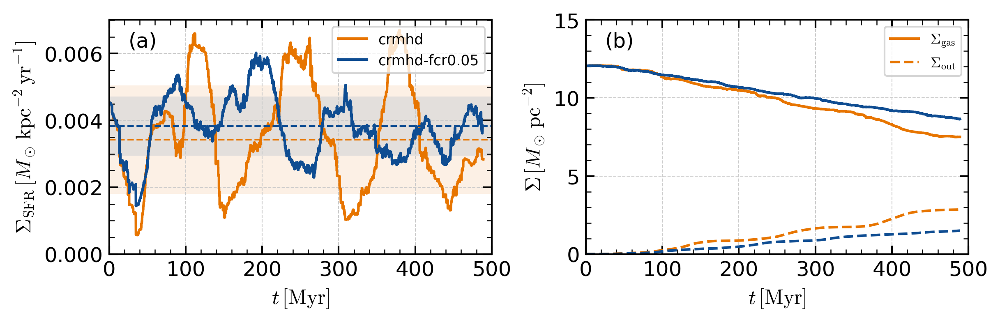

In [14]:
fig = ps.plot_history(simgroup, group, tslice=tslice)

crmhd_v2-8pc-b1-diode-lngrad_out 804.6755270257107 253.4246756481058
crmhd_v2-8pc-b1-diode-lngrad_out rho: P0=1.73e+00, H=0.196 kpc
crmhd_v2-8pc-b1-diode-lngrad_out Pok_cr: P0=7.20e+03, H=5.996 kpc
crmhd_v2-8pc-b1-diode-lngrad_out Pok_th: P0=3.65e+03, H=0.323 kpc
crmhd_v2-8pc-b1-diode-lngrad_out Pok_kin: P0=1.44e+04, H=0.496 kpc
crmhd_v2-8pc-b1-diode-lngrad_out Pi_B: P0=2.72e+03, H=0.188 kpc
physics_crmhd-int_rk2-xo_2-ia_false-fbin_0.0-fgas_0.7-beta_1-MHDBC_diode-CRBC_lngrad_out-shear_false-8pc-fe05 708.6891514729904 265.7261130899435
physics_crmhd-int_rk2-xo_2-ia_false-fbin_0.0-fgas_0.7-beta_1-MHDBC_diode-CRBC_lngrad_out-shear_false-8pc-fe05 rho: P0=1.86e+00, H=0.215 kpc
physics_crmhd-int_rk2-xo_2-ia_false-fbin_0.0-fgas_0.7-beta_1-MHDBC_diode-CRBC_lngrad_out-shear_false-8pc-fe05 Pok_cr: P0=8.34e+03, H=6.215 kpc
physics_crmhd-int_rk2-xo_2-ia_false-fbin_0.0-fgas_0.7-beta_1-MHDBC_diode-CRBC_lngrad_out-shear_false-8pc-fe05 Pok_th: P0=4.38e+03, H=0.331 kpc
physics_crmhd-int_rk2-xo_2-ia_fal

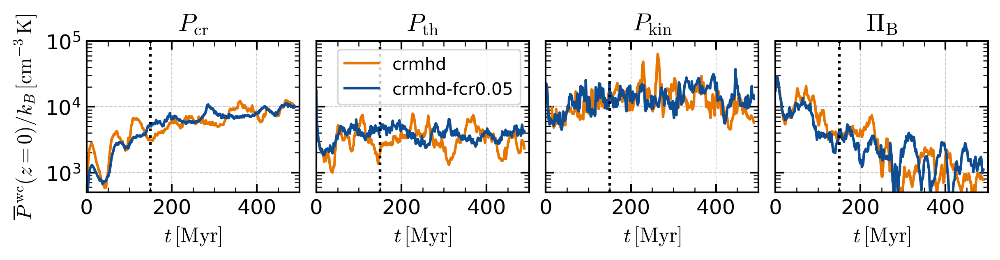

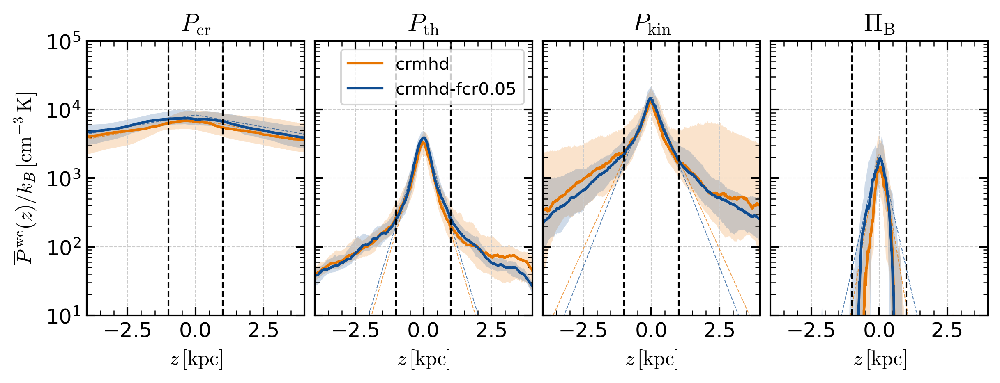

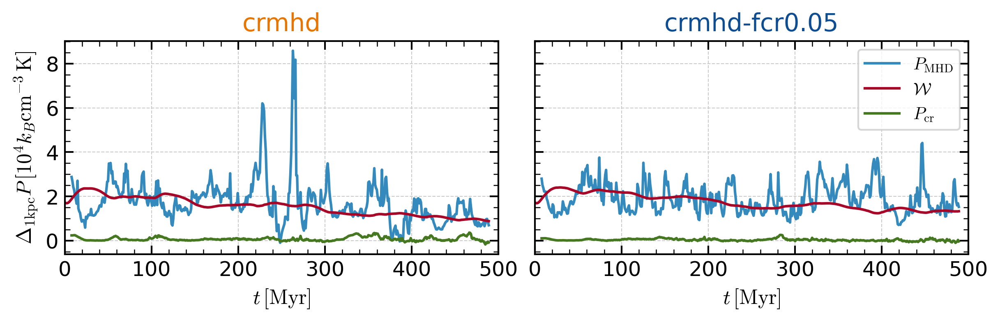

In [15]:
zslice = slice(-50, 50)
f=ps.plot_pressure_t(simgroup, group, zslice=zslice)
f=ps.plot_pressure_z(simgroup, group, tslice=tslice)
f=ps.plot_vertical_equilibrium_t(simgroup, group, zmax=1000)

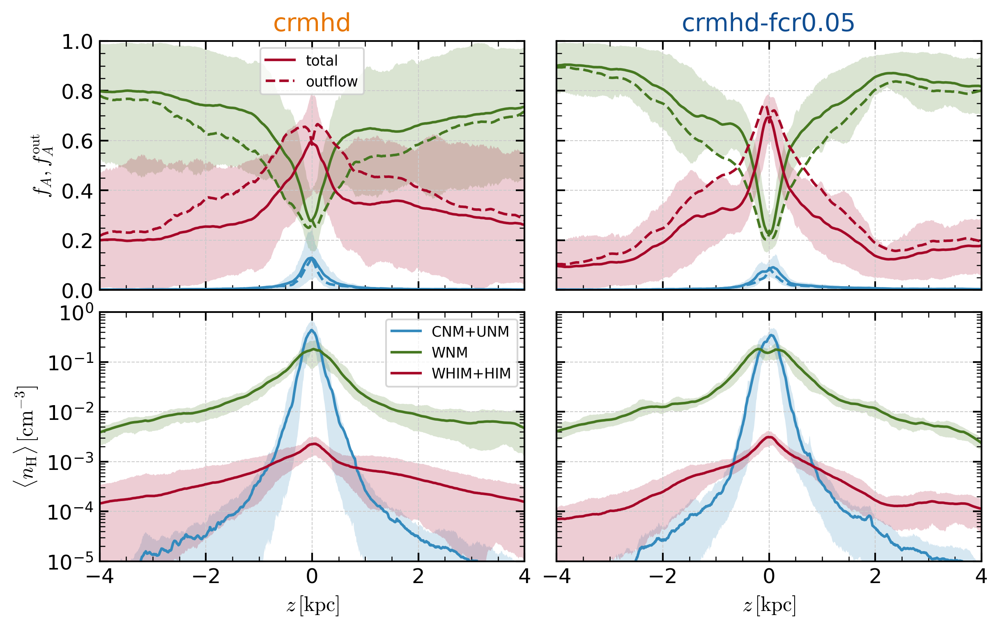

In [16]:
f=ps.plot_area_mass_fraction_z(simgroup, group, tslice=tslice)

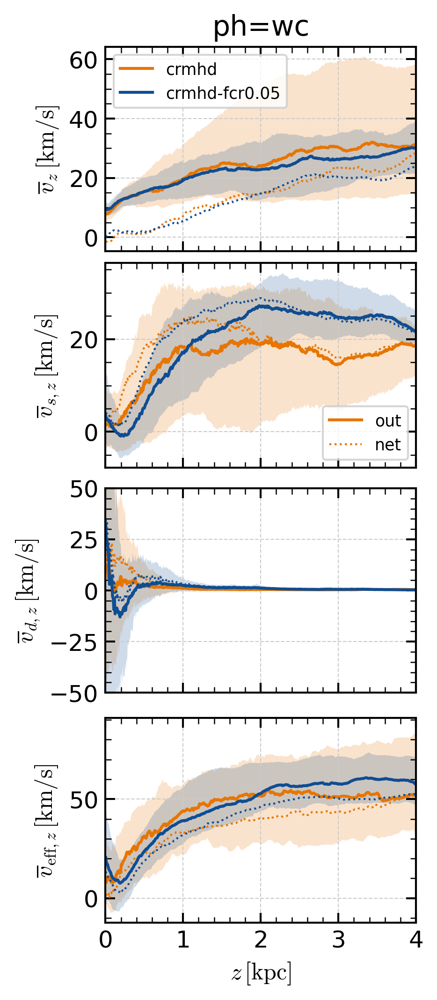

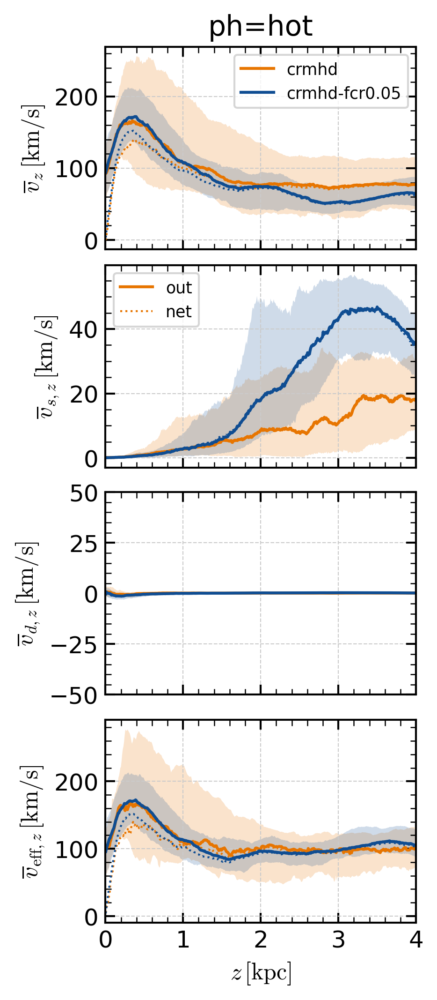

In [17]:
f=ps.plot_velocity_z(simgroup, group, ph="wc", tslice=tslice)
f=ps.plot_velocity_z(simgroup, group, ph="hot", tslice=tslice)

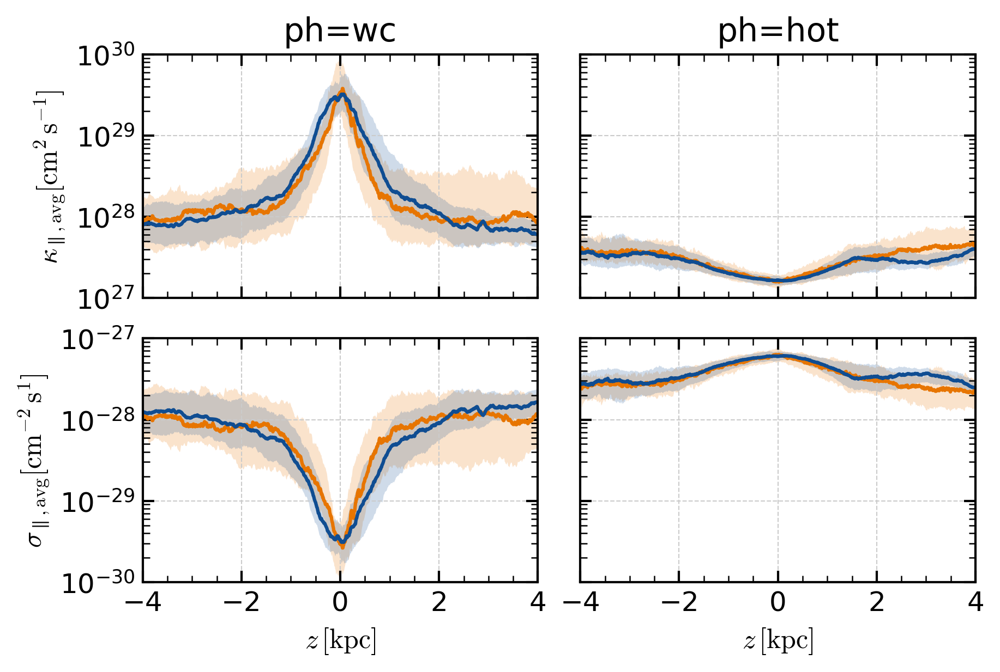

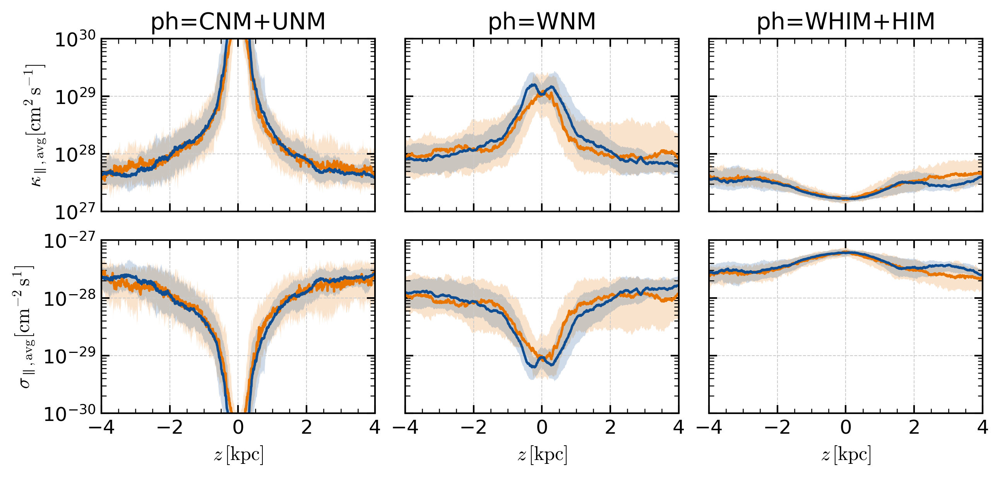

In [18]:
f=ps.plot_kappa_z(simgroup, group, tslice=tslice)
f=ps.plot_kappa_z(
    simgroup,
    group,
    phases=[["CNM", "UNM"], "WNM", ["WHIM", "HIM"]],
    tslice=tslice,
)

crmhd False
crmhd-fcr0.05 True


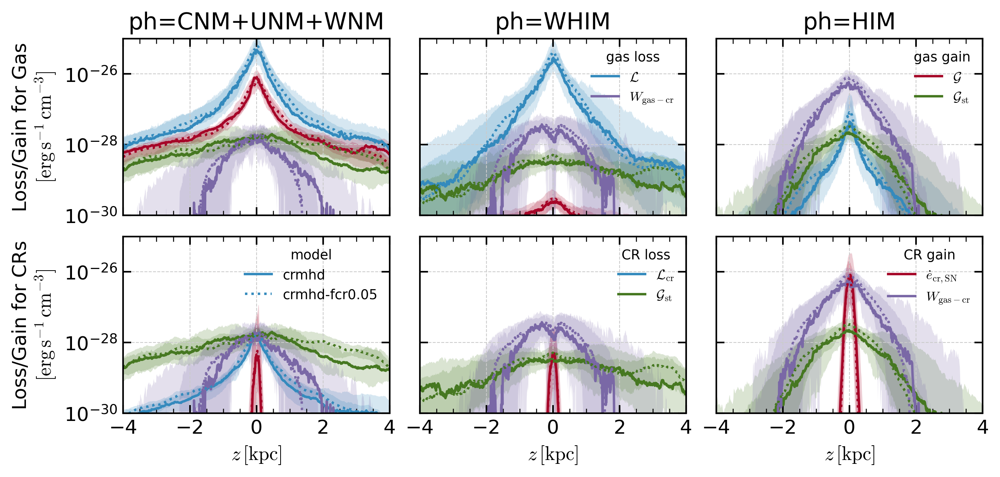

In [59]:
f=ps.plot_gainloss_z(
    simgroup,
    group,
    phases=[["CNM", "UNM", "WNM"], "WHIM", "HIM"],
    tslice=tslice,
)

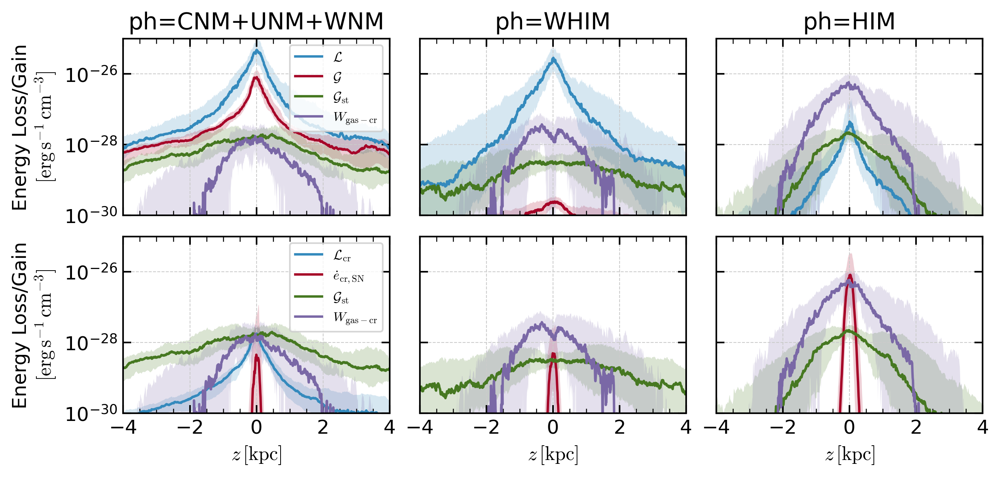

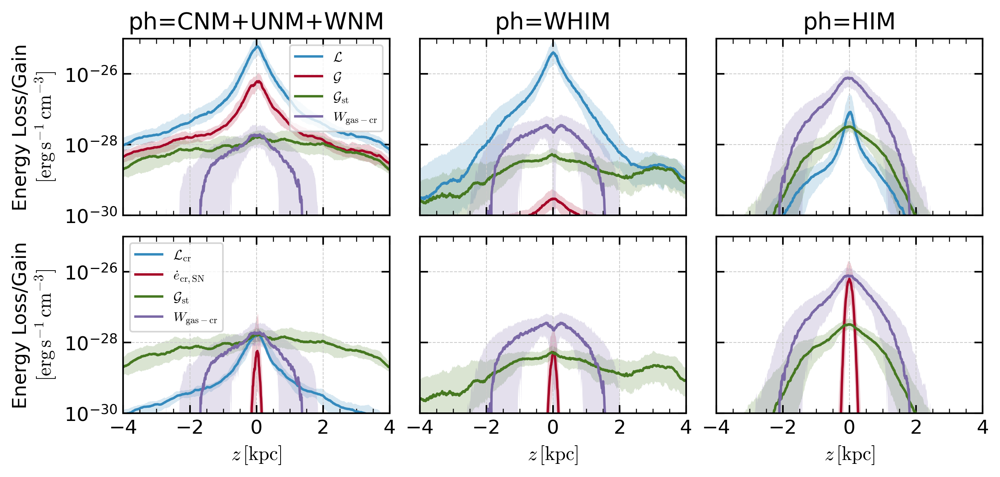

In [45]:
model_list = list(model_name.keys())
for m in model_list:
    s = sims[m]
    f=ps.plot_gainloss_z_each(
        s,
        m,
        phases=[["CNM", "UNM", "WNM"], "WHIM", "HIM"],
        tslice=tslice,
    )

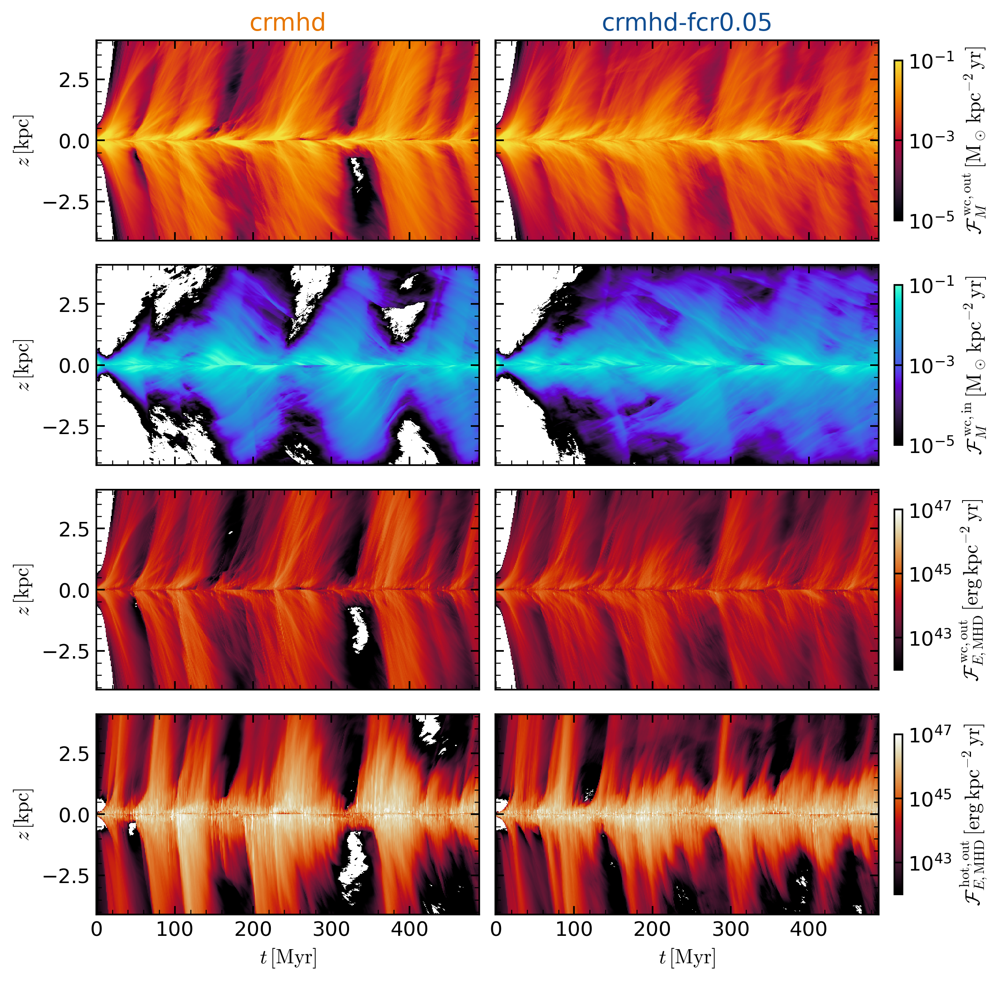

In [20]:
f=ps.plot_flux_tz(simgroup, group)

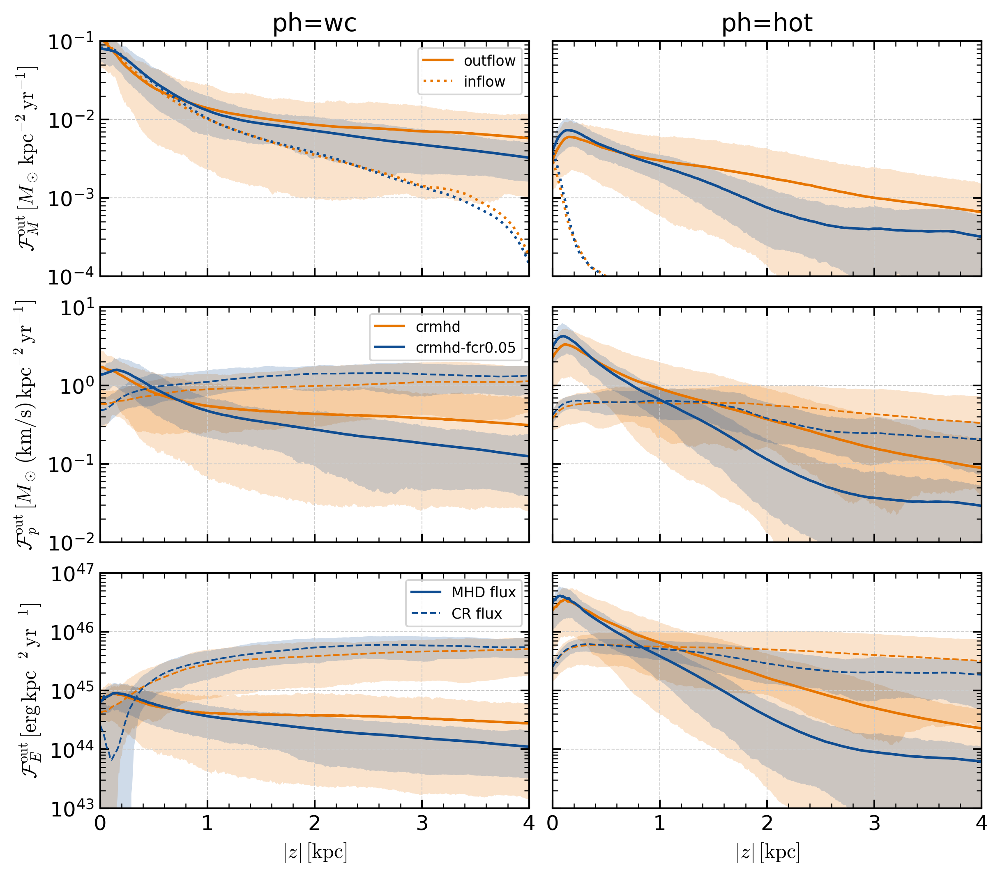

In [39]:
f=ps.plot_flux_z(simgroup, group, vz_dir=1, both=True, tslice=tslice)

[LoadSimTIGRESSPP-INFO] [read_hst]: Reading pickle.
[LoadSimTIGRESSPP-INFO] [read_hst]: Reading pickle.


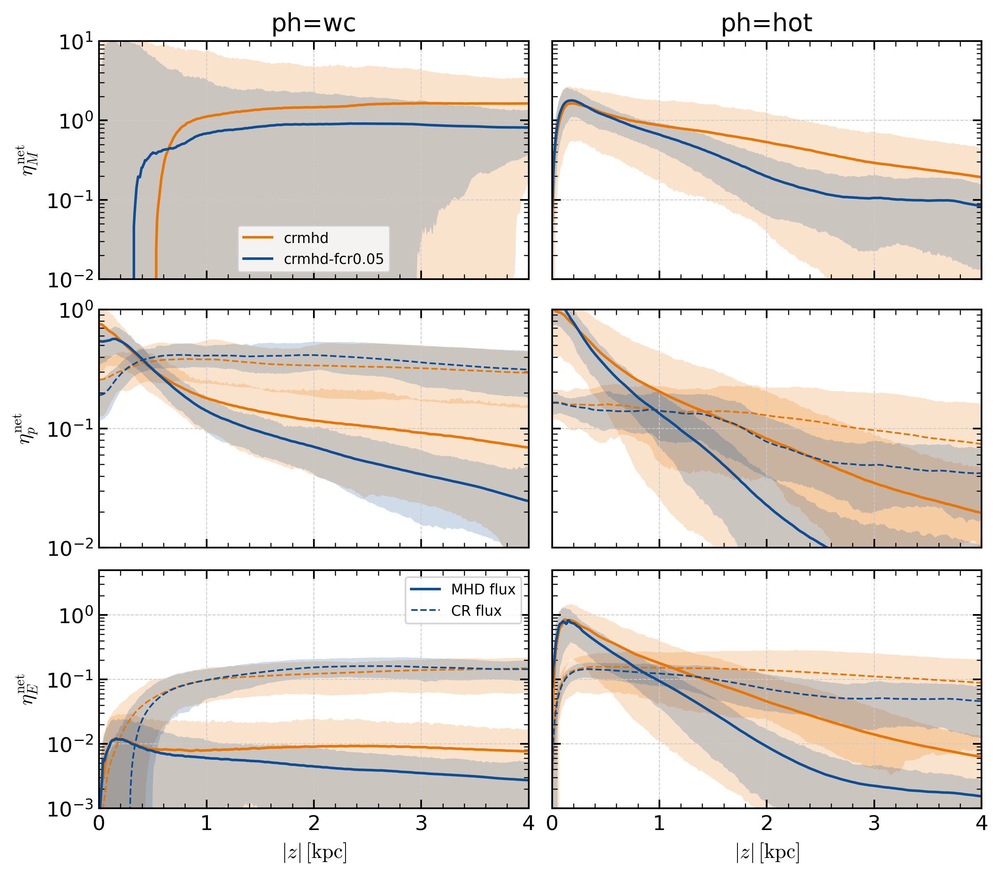

In [60]:
f=ps.plot_loading_z(simgroup, group, vz_dir=None, both=True, tslice=tslice)

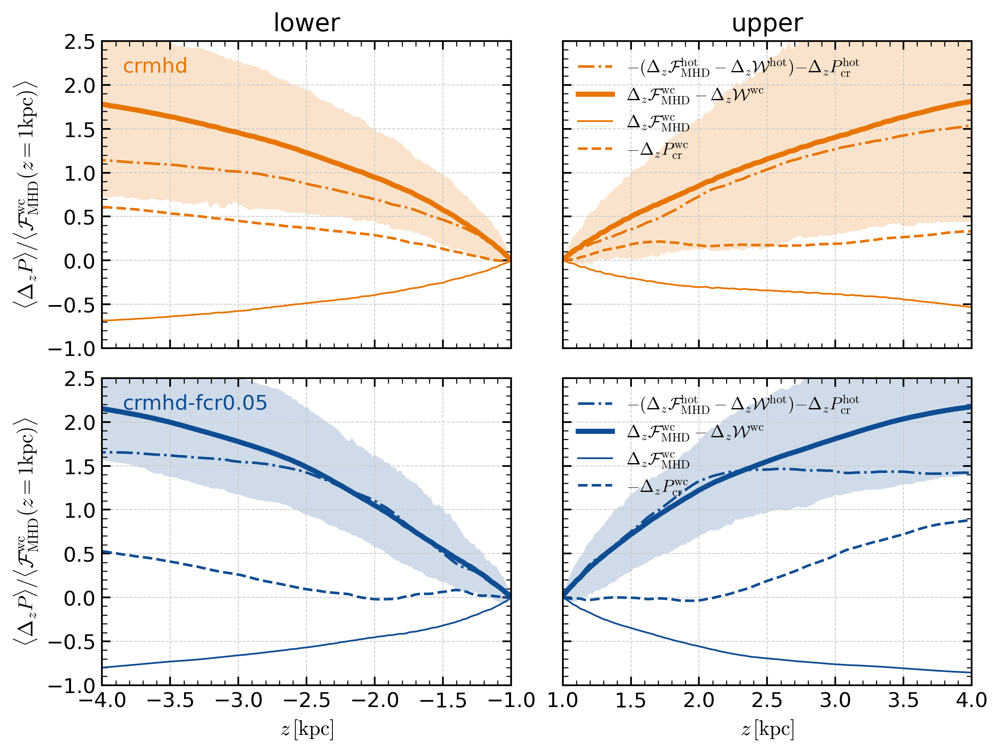

In [23]:
f=ps.plot_momentum_transfer_z(simgroup, group, showall=False, tslice=tslice)

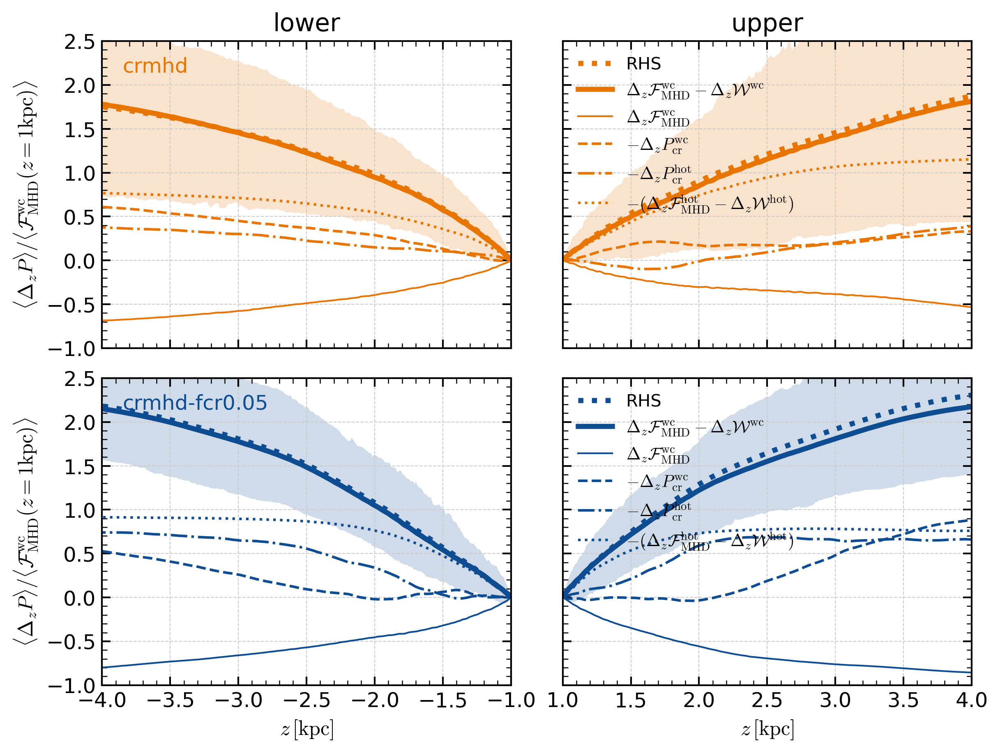

In [24]:
f=ps.plot_momentum_transfer_z(
            simgroup, group, hot="full", showall=True, tslice=tslice
        )

In [95]:
model_list = list(model_name.keys())

In [134]:
import xarray as xr
sim = sims[model_list[0]]

def load_velocity_pdfs(sim, xf = "T", vel_fields = ["velocity3", "0-Vs3", "0-Vd3", "0-Veff3", "Vtotz"]):
    vel_pdfs = dict()
    
    for yf in vel_fields:
        for num in sim.nums:
            if yf not in vel_pdfs:
                vel_pdfs[yf]=[]
            pdf = sim.get_jointpdf(num, "pdf", filebase="-".join([xf,yf]),
                                    xf=xf, yf=yf,
                                    wlist=[None, "nH", "pok_cr"],
                                    xlim=(1,9), ylim=(-1,4),
                                    force_override=False)
            vel_pdfs[yf].append(pdf)
    
    for vf in vfields:
        vel_pdfs[vf] = xr.concat(vel_pdfs[vf],dim="time")        
    return vel_pdfs

In [135]:
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import numpy as np
import cmasher as cmr
def plot_velocity_pdfs(sim, m, wf = "pok_cr", tslice=slice(150,500), savefig=True):
    name = model_name[m]
    vel_pdfs = load_velocity_pdfs(sim)
    vel_fields = list(vel_pdfs.keys())
    fig,axes = plt.subplots(2,3,figsize=(8,6),
                            sharey=True,sharex=True,constrained_layout=True,)
    
    labels={"velocity3":r"$v_z$",
            "0-Vs3":r"$v_{{\rm s},z}$",
            "0-Vd3":r"$v_{{\rm d},z}$",
            "0-Veff3":r"$v_{{\rm eff},z}$",
            "Vtotz":r"$v_{{\rm dyn},z}\equiv v_z+v_{{\rm s},z}$",}
    
    for vf,ax in zip(vel_fields,axes.flat):
        pdf = vel_pdfs[vf].sel(time=tslice).mean(dim="time")
        pok_cr_mean = vel_pdfs[vf][wf].sel(time=tslice).mean(dim="time")
        plt.sca(ax)
        plt.pcolormesh(pdf["log_T"],pdf[f"log_{vf}"],pdf[f"{wf}-pdf"]/pok_cr_mean,
                       norm=LogNorm(1.e-5,1),cmap=cmr.fall_r)
    plt.sca(axes[-1,-1])
    for vf,ax in zip(vel_fields,axes.flat):
        pdf = vel_pdfs[vf].sel(time=tslice).mean(dim="time")
        vf_ = f"log_{vf}"
        # get mean in linear space
        vz = (pdf[f"{wf}-pdf"]*10.**pdf[vf_]).sum(dim=vf_)/(pdf[f"{wf}-pdf"]).sum(dim=vf_)
        vz = np.log10(vz)
        label=labels[vf]
        plt.sca(axes[-1,-1])
        l,=plt.plot(vz["log_T"],vz,label=label)
        plt.sca(ax)
        plt.plot(vz["log_T"],vz,color=l.get_color())
        plt.annotate(label,(0.05,0.95),xycoords="axes fraction",ha="left",va="top")
        # # get mean in log space
        # vz=(pdf[f"{wf}-pdf"]*pdf[vf_]).sum(dim=vf_)/(pdf[f"{wf}-pdf"]).sum(dim=vf_)
        # plt.plot(vz["log_T"],vz,ls=":",color=l.get_color())
    plt.sca(axes[-1,-1])
    plt.legend(fontsize="x-small",loc=2,frameon=False)
    plt.xlim(3,7)
    plt.setp(axes[:,0],ylabel=r"$\log v\,[{\rm km/s}]$")
    plt.setp(axes[-1,:],xlabel=r"$\log T\,[{\rm K}]$")

    if savefig:
        plt.savefig(osp.join(fig_outdir, f"{name}_velocity_pdfs.pdf"))
    return fig

[LoadSimTIGRESSPP-INFO] Read from existing netcdf: /scratch/gpfs/EOST/changgoo/tigress_classic/crmhd_v2-8pc-b1-mhdbc_diode-crbc_lngrad_out-icpx/pdf/T-velocity3.00000.nc
[LoadSimTIGRESSPP-INFO] Read from existing netcdf: /scratch/gpfs/EOST/changgoo/tigress_classic/crmhd_v2-8pc-b1-mhdbc_diode-crbc_lngrad_out-icpx/pdf/T-velocity3.00001.nc
[LoadSimTIGRESSPP-INFO] Read from existing netcdf: /scratch/gpfs/EOST/changgoo/tigress_classic/crmhd_v2-8pc-b1-mhdbc_diode-crbc_lngrad_out-icpx/pdf/T-velocity3.00002.nc
[LoadSimTIGRESSPP-INFO] Read from existing netcdf: /scratch/gpfs/EOST/changgoo/tigress_classic/crmhd_v2-8pc-b1-mhdbc_diode-crbc_lngrad_out-icpx/pdf/T-velocity3.00003.nc
[LoadSimTIGRESSPP-INFO] Read from existing netcdf: /scratch/gpfs/EOST/changgoo/tigress_classic/crmhd_v2-8pc-b1-mhdbc_diode-crbc_lngrad_out-icpx/pdf/T-velocity3.00004.nc
[LoadSimTIGRESSPP-INFO] Read from existing netcdf: /scratch/gpfs/EOST/changgoo/tigress_classic/crmhd_v2-8pc-b1-mhdbc_diode-crbc_lngrad_out-icpx/pdf/T-veloc

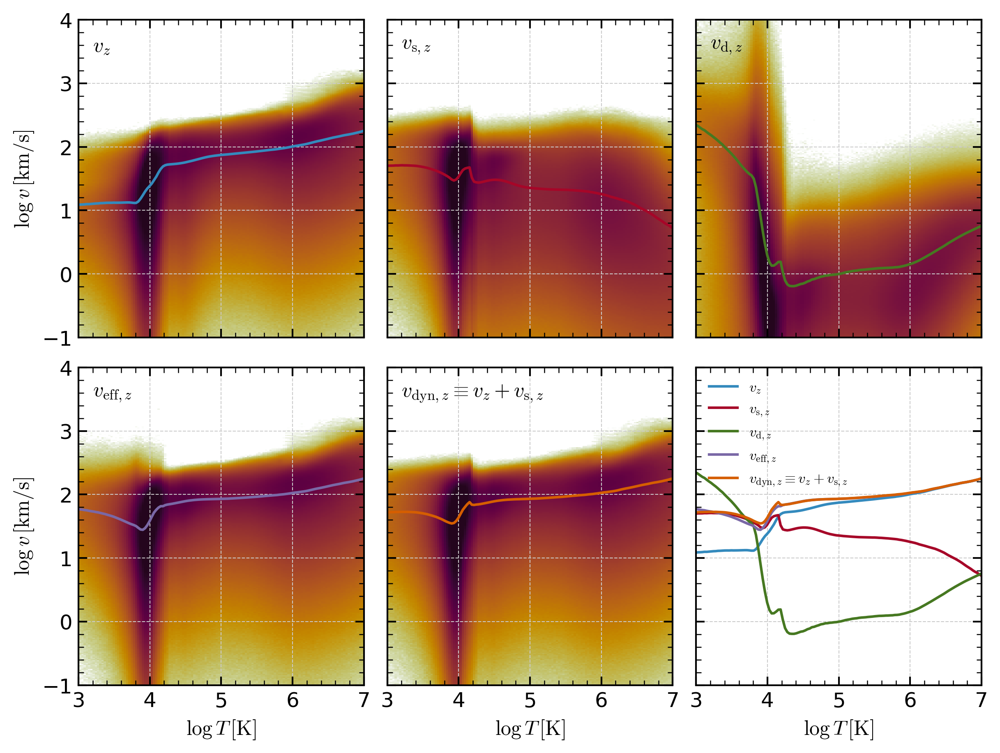

In [136]:
f = plot_velocity_pdfs(sim)

In [115]:
pdf["pok_cr-pdf"].mean(dim="log_Vtotz")/pdf["pok_cr-pdf"].sum()

<xarray.DataArray 'pok_cr-pdf' (log_T: 255)> Size: 2kB
array([0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 1.12869340e-06,
       4.38561270e-07, 1.23253378e-08, 9.75041018e-09, 8.36766306e-09,
       8.02902828e-09, 7.86293013e-09, 7.73824552e-09, 7.46474251e-09,
       7.87333529e-09, 7.84738807e-09, 7.96919055e-09, 8.35800354e-09,
       8.68969212e-09, 9.27313568e-09, 1.00324443e-08, 1.14446125e-08,
       1.36116485e-08, 1.74179531e-08, 2.10803731e-08, 2.64764103e-08,
       3.19126544e-08, 3.76958344e-08, 4.44181814e-08, 5.17360249e-08,
       5.76298408e-08, 6.42269998e-08, 7.15232290e-08, 7.94114096e-08,
       8.65820147e-08, 9.25176620e-08, 9.96034862e-08, 1.06822121e-07,
       1.11467350e-07, 1.18072097e-07, 1.25506632e-07, 1.30545064e-07,
       1.37955764e-07, 1.42715948e-07, 1.48661424e-07, 1.54043567e-07,
       1.59824902e-07, 1.66181511e-07, 1.74834339e-07, 1.81247421e-07,
       1.88324465e-07, 1.96188686e-07, 2.04595807e-07, 2.14124281e-07,
       2.25203969e-07, 2.35202841e-07, 2.46239127e-07, 2.59620015e-07,
       2.72805809e-07, 2.88390398e-07, 3.03123826e-07, 3.24068539e-07,
       3.42323253e-07, 3.65159645e-07, 3.92549078e-07, 4.19447856e-07,
       4.50110315e-07, 4.89020149e-07, 5.25137274e-07, 5.73006831e-07,
       6.23428167e-07, 6.78998414e-07, 7.44391248e-07, 8.27944053e-07,
       9.17667775e-07, 1.02515976e-06, 1.15253332e-06, 1.30183139e-06,
       1.49296650e-06, 1.72665772e-06, 2.01794733e-06, 2.39006199e-06,
...
       1.18463572e-05, 1.14441051e-05, 1.10503402e-05, 1.06085054e-05,
       1.01943789e-05, 9.75245108e-06, 9.28450402e-06, 8.83210704e-06,
       8.42729352e-06, 8.09151042e-06, 7.72766784e-06, 7.37684680e-06,
       7.01306179e-06, 6.63985094e-06, 6.26057345e-06, 5.88302124e-06,
       5.54764572e-06, 5.21527455e-06, 4.88213467e-06, 4.56425088e-06,
       4.25281654e-06, 3.88367917e-06, 3.51175968e-06, 3.17540699e-06,
       2.81986131e-06, 2.47526459e-06, 2.15459862e-06, 1.82260108e-06,
       1.51720090e-06, 1.22633951e-06, 9.49289213e-07, 7.24798568e-07,
       5.45143378e-07, 4.11602644e-07, 3.06464264e-07, 2.20343018e-07,
       1.60011521e-07, 1.15375924e-07, 8.21625570e-08, 6.07448975e-08,
       4.62272757e-08, 3.57890692e-08, 2.80958848e-08, 2.17676932e-08,
       1.83230653e-08, 1.61679279e-08, 1.34156888e-08, 1.20602239e-08,
       1.04985297e-08, 9.29953837e-09, 8.33703996e-09, 7.32673885e-09,
       6.17331953e-09, 5.78283820e-09, 5.32233189e-09, 4.81733014e-09,
       4.22142671e-09, 3.63339916e-09, 2.98078868e-09, 2.44648771e-09,
       2.51511707e-09, 2.26071623e-09, 1.83405987e-09, 1.60298182e-09,
       1.19014485e-09, 8.78917129e-10, 5.24135706e-10, 3.82478241e-10,
       2.87882946e-10, 2.18206060e-10, 2.24864078e-10, 1.44006196e-10,
       1.34786321e-10, 6.14528595e-11, 9.77777869e-11, 7.51999167e-11,
       9.18122754e-11, 7.04761884e-11, 3.62859625e-11])
Coordinates:
  * log_T    (log_T) float64 2kB 1.016 1.047 1.078 1.11 ... 8.922 8.953 8.984
    vol      int64 8B 16777216

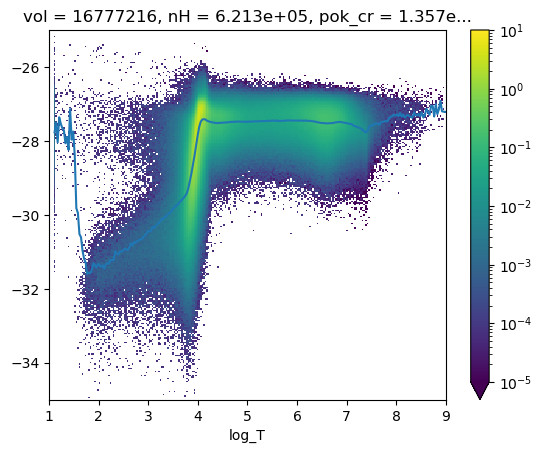

In [35]:
import numpy as np
(pdf["pok_cr-pdf"]/pdf["pok_cr"]).plot(norm=LogNorm(1.e-5,10))
vf = f"log_{yf}"
vz=(pdf[wf]*pdf[vf]).sum(dim=vf)/(pdf[wf]).sum(dim=vf)
vz.plot()

[LoadSimTIGRESSPP-INFO] Read from existing netcdf: /scratch/gpfs/EOST/changgoo/tigress_classic/crmhd_v2-8pc-b1-mhdbc_diode-crbc_lngrad_out-icpx/pdf/T-kappa_para.00100.nc
[LoadSimTIGRESSPP-INFO] Read from existing netcdf: /scratch/gpfs/EOST/changgoo/tigress_classic/crmhd_v2-8pc-b1-mhdbc_diode-crbc_lngrad_out-icpx/pdf/T-sigma_para.00100.nc


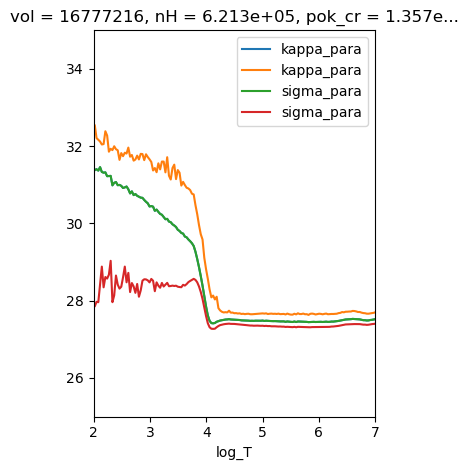

In [47]:
import matplotlib.pyplot as plt
wf = "pok_cr-pdf"
plt.subplot(121)
yf = "kappa_para"
pdf = sim.get_jointpdf(num, "pdf", filebase="-".join([xf,yf]),
                        xf=xf, yf=yf,
                        wlist=[None, "nH", "pok_cr"],
                        xlim=(1,9), ylim=(-1,4),
                        force_override=False)
vf = f"log_{yf}"
vz=(pdf[wf]*pdf[vf]).sum(dim=vf)/(pdf[wf]).sum(dim=vf)
vz.plot(label=yf)
vf = f"log_{yf}"
vz=(pdf[wf]*10**pdf[vf]).sum(dim=vf)/(pdf[wf]).sum(dim=vf)
np.log10(vz).plot(label=yf)
# plt.yscale("log")
plt.xlim(2,7)
plt.ylim(25,35)

# plt.subplot(122)
yf = "sigma_para"
pdf = sim.get_jointpdf(num, "pdf", filebase="-".join([xf,yf]),
                        xf=xf, yf=yf,
                        wlist=[None, "nH", "pok_cr"],
                        xlim=(1,9), ylim=(-1,4),
                        force_override=False)
vf = f"log_{yf}"
vz=(pdf[wf]*pdf[vf]).sum(dim=vf)/(pdf[wf]).sum(dim=vf)
(-vz).plot(label=yf)
vf = f"log_{yf}"
vz=(pdf[wf]*10**pdf[vf]).sum(dim=vf)/(pdf[wf]).sum(dim=vf)
np.log10(1/vz).plot(label=yf)

# plt.yscale("log")
plt.xlim(2,7)
plt.ylim(25,35)
plt.legend()
plt.tight_layout()

[LoadSimTIGRESSPP-INFO] Read from existing netcdf: /scratch/gpfs/EOST/changgoo/tigress_classic/crmhd_v2-8pc-b1-mhdbc_diode-crbc_lngrad_out-icpx/pdf/T-velocity3.00100.nc
[LoadSimTIGRESSPP-INFO] Read from existing netcdf: /scratch/gpfs/EOST/changgoo/tigress_classic/crmhd_v2-8pc-b1-mhdbc_diode-crbc_lngrad_out-icpx/pdf/T-0-Vs3.00100.nc
[LoadSimTIGRESSPP-INFO] Read from existing netcdf: /scratch/gpfs/EOST/changgoo/tigress_classic/crmhd_v2-8pc-b1-mhdbc_diode-crbc_lngrad_out-icpx/pdf/T-0-Vd3.00100.nc
[LoadSimTIGRESSPP-INFO] Read from existing netcdf: /scratch/gpfs/EOST/changgoo/tigress_classic/crmhd_v2-8pc-b1-mhdbc_diode-crbc_lngrad_out-icpx/pdf/T-0-Veff3.00100.nc
[LoadSimTIGRESSPP-INFO] Read from existing netcdf: /scratch/gpfs/EOST/changgoo/tigress_classic/crmhd_v2-8pc-b1-mhdbc_diode-crbc_lngrad_out-icpx/pdf/T-Vtotz.00100.nc


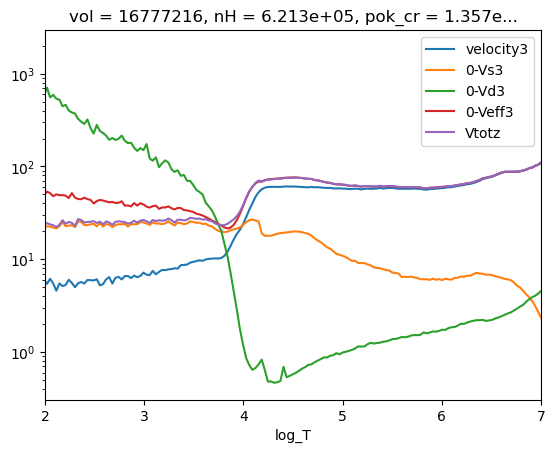

In [23]:
import matplotlib.pyplot as plt
wf = "pok_cr-pdf"
for yf in ["velocity3", "0-Vs3", "0-Vd3", "0-Veff3", "Vtotz"]:
    pdf = sim.get_jointpdf(num, "pdf", filebase="-".join([xf,yf]),
                            xf=xf, yf=yf,
                            wlist=[None, "nH", "pok_cr"],
                            xlim=(1,9), ylim=(-1,4),
                            force_override=False)
    vf = f"log_{yf}"
    vz=(pdf[wf]*10.**pdf[vf]).sum(dim=vf)/(pdf[wf]).sum(dim=vf)
    vz.plot(label=yf)
plt.yscale("log")
plt.xlim(2,7)
plt.legend()

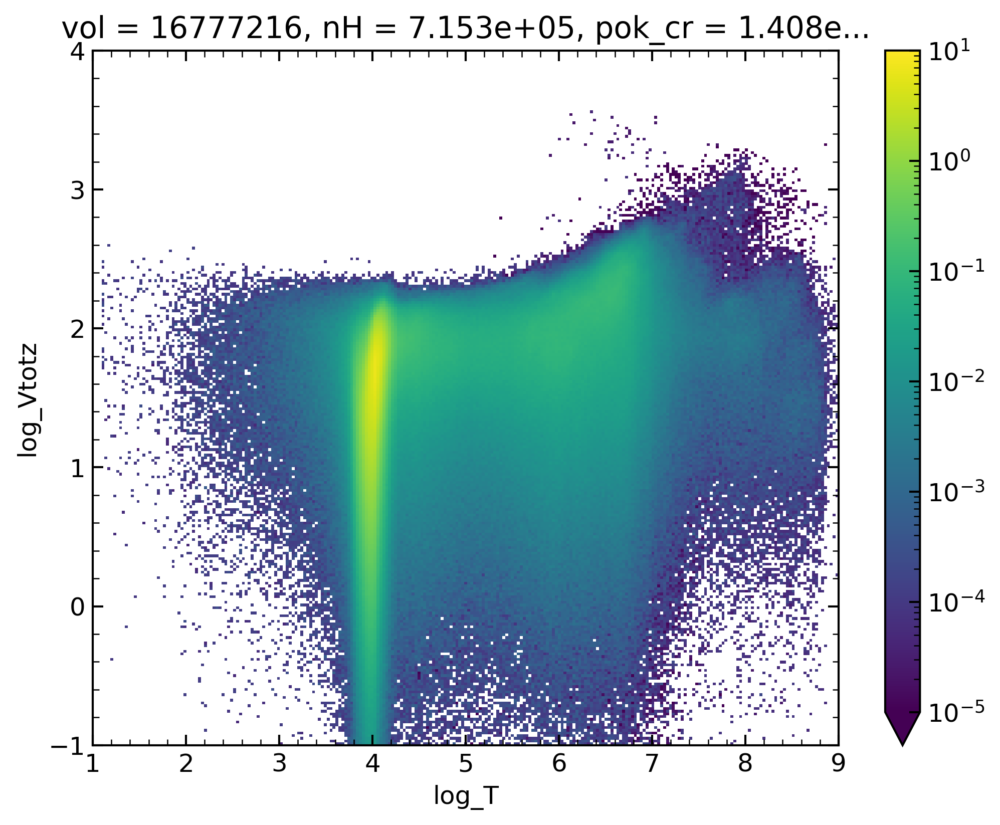

In [87]:
(pdf["pok_cr-pdf"]/pdf["pok_cr"]).plot(norm=LogNorm(1.e-5,1.e1))

In [ ]:
(pdf["vol-pdf"]/(vtot)).plot(norm=LogNorm(1.e-4,10))
for wf in ["vol-pdf","nH-pdf","pok_cr-pdf"]:
    vtotz=(pdf_vT_sum[wf]*10.**pdf_vT_sum["log_Vtotz"]).sum(dim="log_Vtotz")/(pdf_vT_sum[wf]).sum(dim="log_Vtotz")
    np.log10(vtotz).plot()